In [1]:
#!/usr/bin/env python
# -*- coding: utf-8 -*-
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
import yaml
import numpy as np
from sklearn.metrics import r2_score, mean_squared_error,mean_absolute_error
import sys
sys.path.append("..")
from uvsw_part import simulation
import copy
from math import e
import math
import plotly.graph_objects as go
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import train_test_split

import keras
from keras import Sequential
from keras.layers import Dense, Activation
from keras.optimizers import Adam,RMSprop,SGD

from keras import backend as K

In [2]:
# Seed value (can actually be different for each attribution step)
seed_value= 0

# 1. Set `PYTHONHASHSEED` environment variable at a fixed value
import os
os.environ['PYTHONHASHSEED']=str(seed_value)

# 2. Set `python` built-in pseudo-random generator at a fixed value
import random
random.seed(seed_value)

# 3. Set `numpy` pseudo-random generator at a fixed value
import numpy as np
np.random.seed(seed_value)

# 4. Set `tensorflow` pseudo-random generator at a fixed value
import tensorflow as tf
tf.random.set_seed(seed_value) # tensorflow 2.x
# tf.set_random_seed(seed_value) # tensorflow 1.x

In [3]:
LIST_PATH_1 = "../data/params/List1.txt"
LIST_PATH_2 = "../data/params/List2.txt"

In [4]:
def t_couverture (ref,dfy):
    """
    Fonction permettant de calculer le pourcentage de valeurs du modèle simplifié compris à l'intérieur du modèle de réference
    
    Arguments :
        ref (pandas.core.series.Series)        : Modèle de reférence
        dfy (numpy.ndarray)                    : Modèle simplifié genéré par le simulateur
        
    Sortie :
        Taux de couverture des données (float) : Pourcentage de valeurs de la simulation 
        à l'intérieur de la réference   
    """
    same_sign = 0 # Nombres de même signe dans reference et simulation (pris 1 par 1)
    diff_sign = 0 # Nombres de signes différents dans reference et simulation (pris 1 par 1)
    couverture = 0 # Nombres de même signe ET avec la ref qui couvre la simulation
    
    ref_taille = len(ref) # Nombre total de valeurs dans ref et sim
    
    
    for i in range(0,ref_taille):
        if(np.sign(ref[i]) == np.sign(dfy[i])): #Si la reference et la sim sont du même signe
            same_sign = same_sign + 1


            if(ref[i] < 0): # Quand la reference < 0
                if(ref[i] - dfy[i] < 0):
                    couverture = couverture + 1
                

            if(ref[i] > 0): # Quand la reference > 0
                if(ref[i] - dfy[i] > 0):
                    couverture = couverture + 1

            if(ref[i] == 0): # Quand la reference = 0
                if(ref[i] - dfy[i] == 0):
                    couverture = couverture + 1

            if(math.isnan(ref[i]) and math.isnan(dfy[i]) == True): # Quand la reference = NaN
                couverture = couverture + 1             
            
        else :
            diff_sign = diff_sign + 1 # Si ce n'est pas le même signe
            

    taux_couverture = (couverture / ref_taille) * 100 # Calcul du taux en pourcentage
            
    print("Nombres de valeurs au total = " + str(ref_taille))
    print("Nombres de valeurs dans sim et ref avec le même signe = " + str(same_sign))
    print("Nombres de valeurs avec sim et ref avec signes differents = " + str(diff_sign))
    print("----------------------------------")
    print("Total des 2 par rapport à la reference = " + str(same_sign + diff_sign) + " / " + str(ref_taille))
    print("Nombres de valeurs dans sim et ref avec le même signe ET couverts = " + str(couverture) + " / " + str(same_sign))
 
    print("----------------------------------")
    
    
    print("Pourcentage de couverture : " + str(taux_couverture) + "%")
    return taux_couverture


In [5]:
def generate_ts(u,h,tension,clo,LIST_PATH,TS_INDEX) :
    
    """
    Fonction utilisant les paramètres de u,h,tension,cl0 pour génerer une Time-Series de simulation.
    Comparaison du modèle de simulation ave le modèle de réference chargé avec le fichier Liste souhaité et l'index de la Time-Series
    
    Arguments : 
        u (float)          : Paramètre
        h (float)          : Paramètre
        tension (float)    : Paramètre
        cl0 (float)        : Paramètre
        LIST_PATH (string) : Chemin vers le fichier Liste
        TS_INDEX (int)     : Index de la Time-Series à charger (commence à 0) 
    
    Sortie : 
        Visualisation graphique du modèle simplifié et du modèle de réference avec Matplotlib
        Visualisation graĥique du modèle simplifié et du modèle de réference Plotly
    
    """

    #Chargement du fichier List*.txt avec le chemin
    data_list = pd.read_csv(LIST_PATH, delim_whitespace=True)
    
    #Chargement des paramètres de base d'une Time-Series pour la simulation avec son index (Index commence à 0)
    set_params = data_list.iloc[TS_INDEX,:]

    #Chargement des Time-Series de réference selon le fichier Liste utilisé
    list_number = LIST_PATH[-9:]

    if(list_number == "List1.txt"):
        ref = pd.read_csv("../data/ref/list1/graph{}.csv".format(set_params["nc"]))
        print("Chargement du fichier Liste : Liste_1")
    if(list_number == "List2.txt"):
        ref = pd.read_csv("../data/ref/list2/graph{}.csv".format(set_params["nc"]))
        print("Chargement du fichier Liste : Liste_2")
    if(list_number !=  "List1.txt" and list_number != "List2.txt" ):
        print("Erreur, Numéro de liste non supporté")
    
    
    
    
    #Chargement du fichier YAML contenant la liste des paramètres
    cfg = yaml.safe_load(open('../data/config/example.in.yaml', 'r'))

    #Chargement des paramètres à tester 
    cfg["cable"]["h"] = float(h)
    cfg["cable"]["tension"] = float(tension)
    cfg["wakeosc"]["u"] = float(u)
    cfg["wakeosc"]["cl0"]= float(clo)

    #Setup des paramètres permettant de produire un modèle simplifié de même longueur que le modèle de réference
    cfg["simulation"]["tf"] = float(set_params["tf[s]"])
    cfg["simulation"]["dt"] = cfg["simulation"]["tf"] / len(ref) 
    cfg["simulation"]["dr"] = cfg["simulation"]["tf"] / len(ref) 



    print("h Value: ", cfg["cable"]["h"], " u Value: ", cfg["wakeosc"]["u"]," tension Value: ",cfg["cable"]["tension"])
    print("tf Value ", cfg["simulation"]["tf"])
    
    # Lancement du simulateur
    dfy, _ = simulation.run_cable_wakeosc(cfg)
    
    #Calcul des métriques
    mse = mean_squared_error(ref['y/d'],(dfy['s=0.250']/0.025).values[:-1])
    rmse = mean_squared_error(ref['y/d'],(dfy['s=0.250']/0.025).values[:-1],squared = False)
    mea = mean_absolute_error(ref['y/d'],(dfy['s=0.250']/0.025).values[:-1])
    r2 = r2_score(ref['y/d'],(dfy['s=0.250']/0.025).values[:-1])
    taux_couverture = t_couverture(ref['y/d'],(dfy['s=0.250']/0.025).values[:-1])
    
    
    #Stockage des métriques sous format texte en vue de la visualisation
    mse_text= "MSE = %s " % mse
    rmse_text = "RMSE = %s " % rmse
    mea_text = "MEA = %s " % mea
    r2_text = "R2 = %s " % r2
    taux_couverture_text = "Taux de couverture = %s %%" % taux_couverture


    #Visualisation avec Matplotlib
    plt.figure(figsize = (20,8))
    plt.plot(ref['time'], ref['y/d'], label = "Signal de reference")
    plt.plot(dfy.index, dfy['s=0.250']/0.025, label = "Signal du simulateur")
    plt.xlabel('time (s)',fontsize=18)
    plt.ylabel('y/d',fontsize=18)

    #Affichage des métriques dans la visualisation
    plt.figtext(0.5, 0.00, mse_text, ha="center", fontsize=18, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
    plt.figtext(0.5, -0.05, rmse_text, ha="center", fontsize=18, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
    plt.figtext(0.5, -0.10, mea_text, ha="center", fontsize=18, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
    plt.figtext(0.5, -0.15, r2_text, ha="center", fontsize=18, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})

    
    plt.figtext(0.5, -0.25, "h = '{0}', tension = '{1}', u = '{2}', clo = '{3}', eps = '{4}'".format(cfg['cable']['h'],cfg['cable']['tension'],cfg['wakeosc']['u'],cfg["wakeosc"]["cl0"],cfg["wakeosc"]["eps"]), ha="center", fontsize=18, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
    plt.figtext(0.5, -0.30, taux_couverture_text, ha="center", fontsize=18, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})

    title = "Comparaison du signal de simulation avec le signal de reference"
    plt.title(title,fontsize=18)

    plt.legend()
    plt.show() 

    
    # Visualisation avec Plotly
    fig = go.Figure()
    fig.add_trace(go.Scatter(x=ref['time'], y=ref['y/d'],
                    name='Signal de reference'))
    fig.add_trace(go.Scatter(x=dfy.index, y=dfy['s=0.250']/0.025,
                    name='Signal de simulation'))
    
    fig.update_layout(
        title="Comparaison du signal de simulation avec le signal de reference",
        xaxis_title="Timesteps",
        yaxis_title="Signal",
        legend_title="Signaux",
    )

    fig.show()
    ref_sortie = ref['y/d']
    sim_sortie = (dfy['s=0.250']/0.025).values[:-1]
    
    return ref_sortie,sim_sortie

Chargement du fichier Liste : Liste_1
h Value:  309.49288554663354  u Value:  0.9535838147886668  tension Value:  11605.8732786244
tf Value  4.0
Nombres de valeurs au total = 10000
Nombres de valeurs dans sim et ref avec le même signe = 8202
Nombres de valeurs avec sim et ref avec signes differents = 1798
----------------------------------
Total des 2 par rapport à la reference = 10000 / 10000
Nombres de valeurs dans sim et ref avec le même signe ET couverts = 5012 / 8202
----------------------------------
Pourcentage de couverture : 50.12%


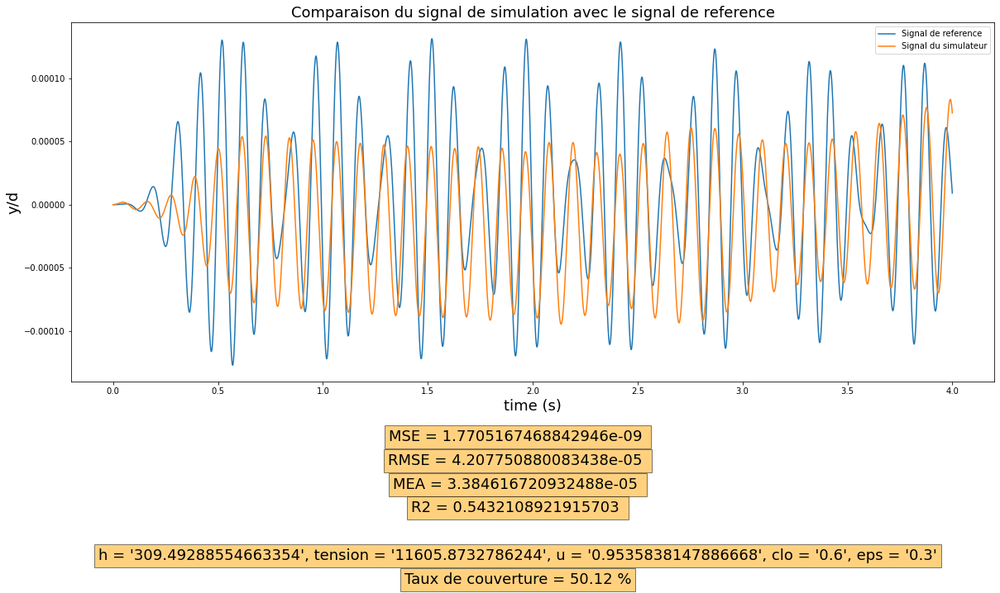

In [6]:
ref_TS_6_List_1, sim_TS_6_List_1 = generate_ts(u = 0.9535838147886668,h = 309.49288554663354,
                       tension = 11605.8732786244,clo = 0.6,
                      LIST_PATH  = LIST_PATH_1,TS_INDEX = 5)

Chargement du fichier Liste : Liste_1
h Value:  310.08561248429135  u Value:  0.9536402206390567  tension Value:  11663.384098943847
tf Value  4.0
Nombres de valeurs au total = 10000
Nombres de valeurs dans sim et ref avec le même signe = 8201
Nombres de valeurs avec sim et ref avec signes differents = 1799
----------------------------------
Total des 2 par rapport à la reference = 10000 / 10000
Nombres de valeurs dans sim et ref avec le même signe ET couverts = 5016 / 8201
----------------------------------
Pourcentage de couverture : 50.160000000000004%


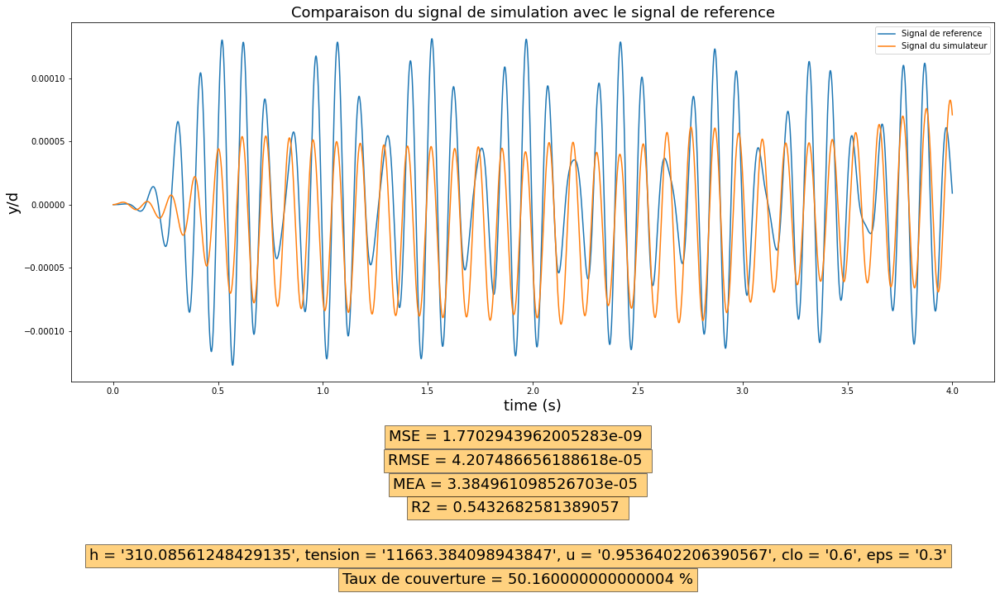

In [9]:
low_1_ref_TS_6_List_1, low_1_sim_TS_6_List_1 = generate_ts(u = 0.9536402206390567,h = 310.08561248429135,
                       tension = 11663.384098943847,clo = 0.6,
                      LIST_PATH  = LIST_PATH_1,TS_INDEX = 5)

Chargement du fichier Liste : Liste_1
h Value:  310.2735358291234  u Value:  0.953624938120232  tension Value:  11686.962012140557
tf Value  4.0
Nombres de valeurs au total = 10000
Nombres de valeurs dans sim et ref avec le même signe = 8202
Nombres de valeurs avec sim et ref avec signes differents = 1798
----------------------------------
Total des 2 par rapport à la reference = 10000 / 10000
Nombres de valeurs dans sim et ref avec le même signe ET couverts = 5021 / 8202
----------------------------------
Pourcentage de couverture : 50.21%


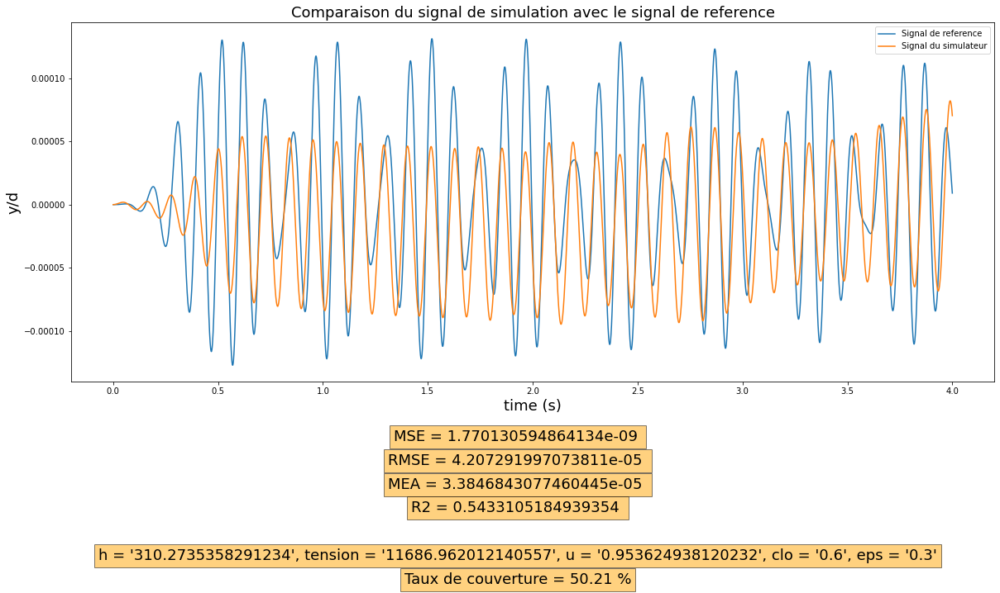

In [10]:
low_2_ref_TS_6_List_1, low_2_sim_TS_6_List_1 = generate_ts(u = 0.953624938120232,h = 310.2735358291234,
                       tension = 11686.962012140557,clo = 0.6,
                      LIST_PATH  = LIST_PATH_1,TS_INDEX = 5)

Chargement du fichier Liste : Liste_1
h Value:  311.3917803902622  u Value:  0.9540430688605763  tension Value:  11671.933550015232
tf Value  4.0
Nombres de valeurs au total = 10000
Nombres de valeurs dans sim et ref avec le même signe = 8178
Nombres de valeurs avec sim et ref avec signes differents = 1822
----------------------------------
Total des 2 par rapport à la reference = 10000 / 10000
Nombres de valeurs dans sim et ref avec le même signe ET couverts = 4975 / 8178
----------------------------------
Pourcentage de couverture : 49.75%


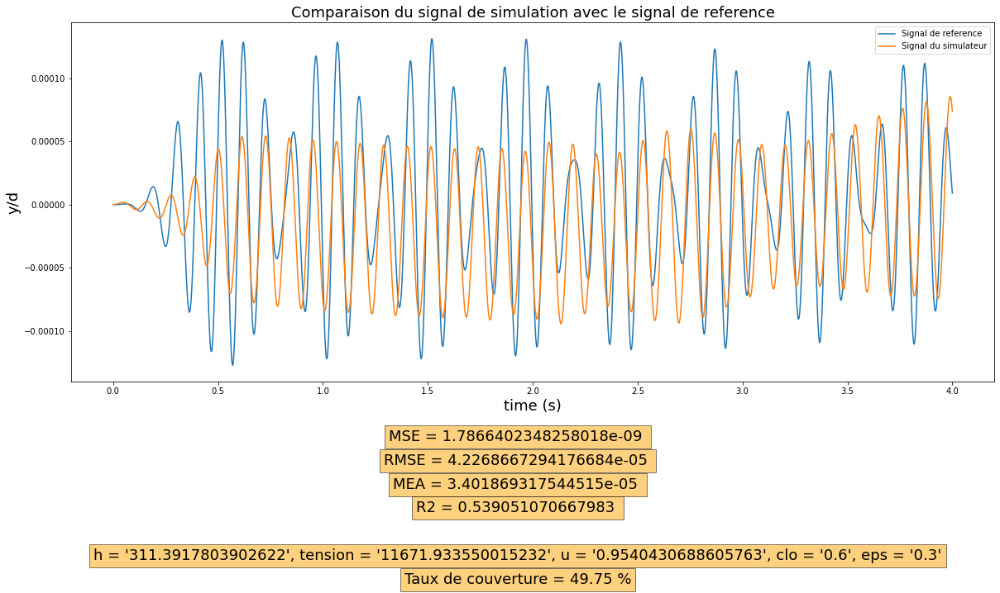

In [11]:
low_3_ref_TS_6_List_1, low_3_sim_TS_6_List_1 = generate_ts(u = 0.9540430688605763,h = 311.39178039026224,
                       tension = 11671.933550015232,clo = 0.6,
                      LIST_PATH  = LIST_PATH_1,TS_INDEX = 5)

Chargement du fichier Liste : Liste_1
h Value:  310.62369530508226  u Value:  0.9534623175954655  tension Value:  11677.677965443818
tf Value  4.0
Nombres de valeurs au total = 10000
Nombres de valeurs dans sim et ref avec le même signe = 8195
Nombres de valeurs avec sim et ref avec signes differents = 1805
----------------------------------
Total des 2 par rapport à la reference = 10000 / 10000
Nombres de valeurs dans sim et ref avec le même signe ET couverts = 4994 / 8195
----------------------------------
Pourcentage de couverture : 49.94%


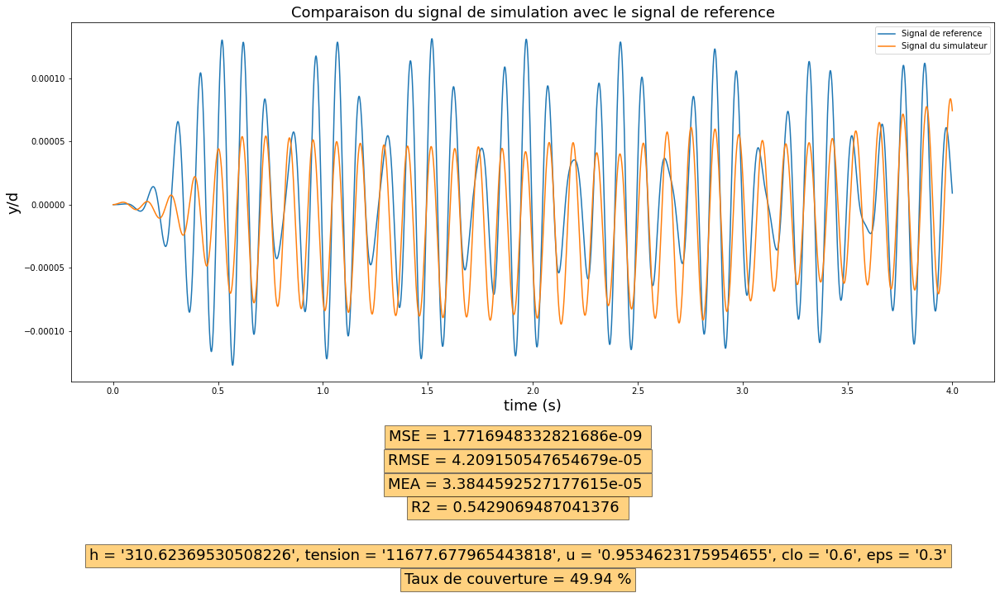

In [12]:
low_4_ref_TS_6_List_1, low_4_sim_TS_6_List_1 = generate_ts(u = 0.9534623175954655,h = 310.62369530508226,
                       tension = 11677.677965443818,clo = 0.6,
                      LIST_PATH  = LIST_PATH_1,TS_INDEX = 5)

Chargement du fichier Liste : Liste_1
h Value:  310.39574951282356  u Value:  0.9538461083727273  tension Value:  11668.56584575358
tf Value  4.0
Nombres de valeurs au total = 10000
Nombres de valeurs dans sim et ref avec le même signe = 8203
Nombres de valeurs avec sim et ref avec signes differents = 1797
----------------------------------
Total des 2 par rapport à la reference = 10000 / 10000
Nombres de valeurs dans sim et ref avec le même signe ET couverts = 5018 / 8203
----------------------------------
Pourcentage de couverture : 50.18%


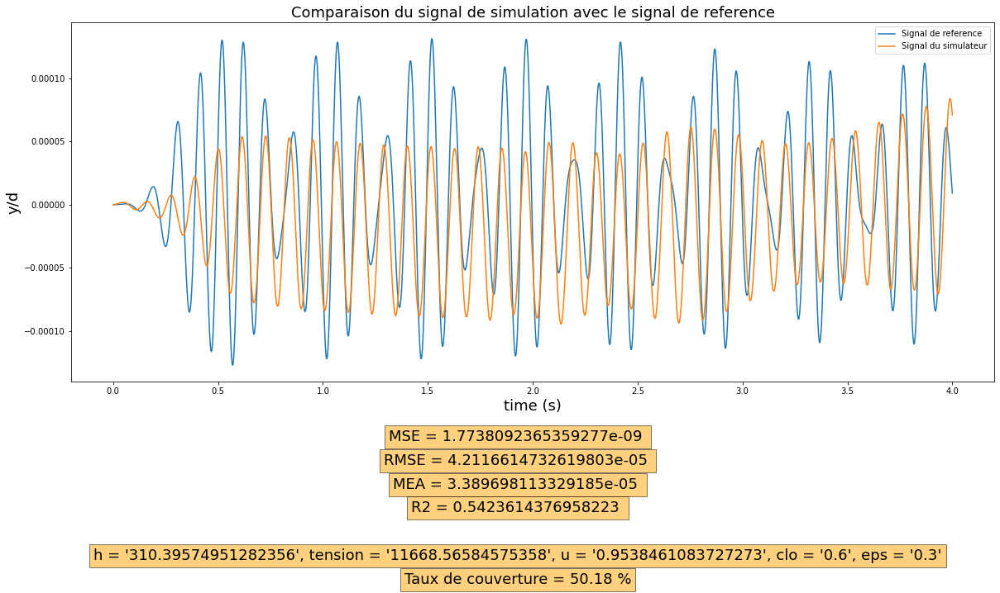

In [13]:
low_5_ref_TS_6_List_1, low_5_sim_TS_6_List_1 = generate_ts(u = 0.9538461083727273,h = 310.39574951282356,
                       tension = 11668.56584575358,clo = 0.6,
                      LIST_PATH  = LIST_PATH_1,TS_INDEX = 5)

In [14]:
"""new_sim_1 = pd.DataFrame({'list': 1, 'n_ts': 6,'sim':sim_TS_6_List_1 })
new_sim_2 = pd.DataFrame({'list': 1, 'n_ts': 6,'sim':low_1_sim_TS_6_List_1 })
new_sim_3 = pd.DataFrame({'list': 1, 'n_ts': 6,'sim':low_2_sim_TS_6_List_1 })
new_sim_4 = pd.DataFrame({'list': 1, 'n_ts': 6,'sim':low_3_sim_TS_6_List_1 })
new_sim_5 = pd.DataFrame({'list': 1, 'n_ts': 6,'sim':low_4_sim_TS_6_List_1 })
new_sim_6 = pd.DataFrame({'list': 1, 'n_ts': 6,'sim':low_5_sim_TS_6_List_1 })

new_ref_1 = pd.DataFrame({'list': 1, 'n_ts': 6,'ref':ref_TS_6_List_1 })
new_ref_2 = pd.DataFrame({'list': 1, 'n_ts': 6,'ref':low_1_ref_TS_6_List_1 })
new_ref_3 = pd.DataFrame({'list': 1, 'n_ts': 6,'ref':low_2_ref_TS_6_List_1 })
new_ref_4 = pd.DataFrame({'list': 1, 'n_ts': 6,'ref':low_3_ref_TS_6_List_1 })
new_ref_5 = pd.DataFrame({'list': 1, 'n_ts': 6,'ref':low_4_ref_TS_6_List_1 })
new_ref_6 = pd.DataFrame({'list': 1, 'n_ts': 6,'ref':low_5_ref_TS_6_List_1 })
"""

"new_sim_1 = pd.DataFrame({'list': 1, 'n_ts': 6,'sim':sim_TS_6_List_1 })\nnew_sim_2 = pd.DataFrame({'list': 1, 'n_ts': 6,'sim':low_1_sim_TS_6_List_1 })\nnew_sim_3 = pd.DataFrame({'list': 1, 'n_ts': 6,'sim':low_2_sim_TS_6_List_1 })\nnew_sim_4 = pd.DataFrame({'list': 1, 'n_ts': 6,'sim':low_3_sim_TS_6_List_1 })\nnew_sim_5 = pd.DataFrame({'list': 1, 'n_ts': 6,'sim':low_4_sim_TS_6_List_1 })\nnew_sim_6 = pd.DataFrame({'list': 1, 'n_ts': 6,'sim':low_5_sim_TS_6_List_1 })\n\nnew_ref_1 = pd.DataFrame({'list': 1, 'n_ts': 6,'ref':ref_TS_6_List_1 })\nnew_ref_2 = pd.DataFrame({'list': 1, 'n_ts': 6,'ref':low_1_ref_TS_6_List_1 })\nnew_ref_3 = pd.DataFrame({'list': 1, 'n_ts': 6,'ref':low_2_ref_TS_6_List_1 })\nnew_ref_4 = pd.DataFrame({'list': 1, 'n_ts': 6,'ref':low_3_ref_TS_6_List_1 })\nnew_ref_5 = pd.DataFrame({'list': 1, 'n_ts': 6,'ref':low_4_ref_TS_6_List_1 })\nnew_ref_6 = pd.DataFrame({'list': 1, 'n_ts': 6,'ref':low_5_ref_TS_6_List_1 })\n"

In [15]:
X_train_1, X_test_1, y_train_1, y_test_1 = train_test_split(sim_TS_6_List_1,ref_TS_6_List_1,test_size = 0.2, random_state = 143,shuffle = False)
X_train_2, X_test_2, y_train_2, y_test_2 = train_test_split(low_1_sim_TS_6_List_1,low_1_ref_TS_6_List_1,test_size = 0.2, random_state = 143,shuffle = False)
X_train_3, X_test_3, y_train_3, y_test_3 = train_test_split(low_2_sim_TS_6_List_1,low_2_ref_TS_6_List_1,test_size = 0.2, random_state = 143,shuffle = False)
X_train_4, X_test_4, y_train_4, y_test_4 = train_test_split(low_3_sim_TS_6_List_1,low_3_ref_TS_6_List_1,test_size = 0.2, random_state = 143,shuffle = False)
X_train_5, X_test_5, y_train_5, y_test_5 = train_test_split(low_4_sim_TS_6_List_1,low_4_ref_TS_6_List_1,test_size = 0.2, random_state = 143,shuffle = False)
X_train_6, X_test_6, y_train_6, y_test_6 = train_test_split(low_5_sim_TS_6_List_1,low_5_ref_TS_6_List_1,test_size = 0.2, random_state = 143,shuffle = False)


In [16]:

X_train = np.concatenate((X_train_1,X_train_2,X_train_3,X_train_4,X_train_5,X_train_6))
X_test = np.concatenate((X_test_1,X_test_2,X_test_3,X_test_4,X_test_5,X_test_6))
y_train = np.concatenate((y_train_1,y_train_2,y_train_3,y_train_4,y_train_5,y_train_6))
y_test = np.concatenate((y_test_1,y_test_2,y_test_3,y_test_4,y_test_5,y_test_6))

"""
X_train = np.concatenate((X_train_1,X_train_2,X_train_3))
X_test = np.concatenate((X_test_1,X_test_2,X_test_3))
y_train = np.concatenate((y_train_1,y_train_2,y_train_3))
y_test = np.concatenate((y_test_1,y_test_2,y_test_3))
"""

'\nX_train = np.concatenate((X_train_1,X_train_2,X_train_3))\nX_test = np.concatenate((X_test_1,X_test_2,X_test_3))\ny_train = np.concatenate((y_train_1,y_train_2,y_train_3))\ny_test = np.concatenate((y_test_1,y_test_2,y_test_3))\n'

In [17]:
X_train = X_train.reshape(-1,1)
X_test = X_test.reshape(-1,1)

In [18]:
model = Sequential()
model.add(Dense(8,input_dim=1,activation='relu'))
model.add(Dense(1))

opt = SGD(learning_rate=0.0001)

model.compile(loss='mean_squared_error', optimizer= opt)

history = model.fit(X_train,y_train,epochs=30,verbose=1)

Epoch 1/30
1500/1500 [==============================] - 5s 3ms/step - loss: 2.7302e-09
Epoch 2/30
1500/1500 [==============================] - 5s 3ms/step - loss: 2.5815e-09
Epoch 3/30
1500/1500 [==============================] - 4s 3ms/step - loss: 2.4574e-09
Epoch 4/30
1500/1500 [==============================] - 5s 3ms/step - loss: 2.3895e-09
Epoch 5/30
1500/1500 [==============================] - 4s 3ms/step - loss: 2.3804e-09
Epoch 6/30
1500/1500 [==============================] - 5s 3ms/step - loss: 2.3112e-09
Epoch 7/30
1500/1500 [==============================] - 5s 4ms/step - loss: 2.2749e-09
Epoch 8/30
1500/1500 [==============================] - 4s 3ms/step - loss: 2.2173e-09
Epoch 9/30
1500/1500 [==============================] - 4s 3ms/step - loss: 2.1813e-09
Epoch 10/30
1500/1500 [==============================] - 4s 2ms/step - loss: 2.1546e-09
Epoch 11/30
1500/1500 [==============================] - 3s 2ms/step - loss: 2.1370e-09
Epoch 12/30
1500/1500 [==================

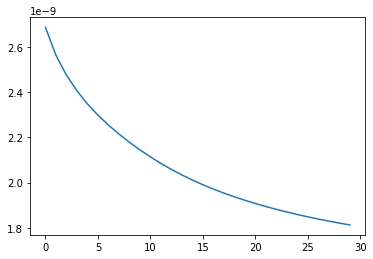

In [19]:
plt.plot(history.history['loss'])

In [20]:
y_pred = model.predict(X_test)

In [21]:
mse = mean_squared_error(y_test,y_pred)
mse

1.4594249325879658e-09

In [22]:
r2 = r2_score(y_test,y_pred)
r2

0.6116097136492673

In [23]:
fig = go.Figure()
fig.add_trace(go.Scatter(y = y_test,
                name='Reference model signal'))
fig.add_trace(go.Scatter(y = y_pred.reshape(-1),
                name='Prediction signal'))

fig.update_layout(
    title="Comparison between reference model and prediction of neural network model with data augmentation",
    xaxis_title="Timesteps",
    yaxis_title="Signal",
    legend_title="Signals",       
)


fig.show()

fig.write_html("Concat_same_ts_hyperopt_split_puis_concat_reseaux_neurones.html")

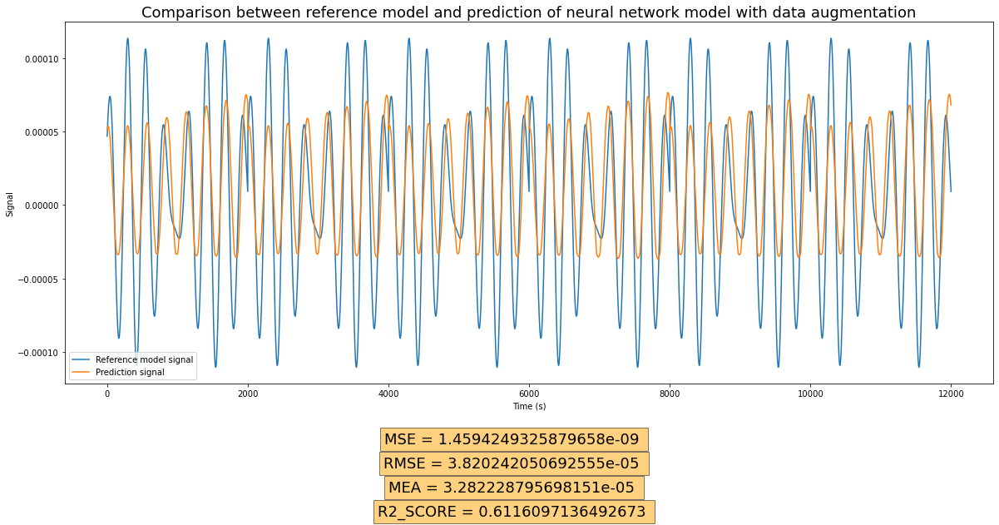

In [24]:
plt.figure(figsize = (20,8))
plt.plot(y_test, label = "Reference model signal")
plt.plot(y_pred, label = "Prediction signal")

rmse = mean_squared_error(y_pred,y_test,squared = False)
mea = mean_absolute_error(y_pred,y_test)
mse = mean_squared_error(y_pred,y_test,squared = True)
r2 = r2_score(y_test,y_pred)

mse_text = "MSE = %s " % mse
rmse_text = "RMSE = %s " % rmse
mea_text = "MEA = %s " % mea
r2_text = "R2_SCORE = %s " % r2

"""
plt.annotate(mse, xy=(0.05, 0.85), xycoords='axes fraction')
plt.annotate(rmse, xy=(0.05, 0.80), xycoords='axes fraction')
plt.annotate(mea, xy=(0.05, 0.75), xycoords='axes fraction')
plt.annotate(p_reussite_precis, xy=(0.02, 0.70), xycoords='axes fraction')
plt.annotate(p_reussite_approx, xy=(0.02, 0.65), xycoords='axes fraction')
"""
plt.figtext(0.5, 0.00, mse_text, ha="center", fontsize=18, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
plt.figtext(0.5, -0.05, rmse_text, ha="center", fontsize=18, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
plt.figtext(0.5, -0.10, mea_text, ha="center", fontsize=18, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})
plt.figtext(0.5, -0.15, r2_text, ha="center", fontsize=18, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})


#plt.figtext(0.5, -0.20, "h = '{0}', tension = '{1}', u = '{2}', clo = '{3}', eps = '{4}'".format(h,tension,u,clo,eps), ha="center", fontsize=18, bbox={"facecolor":"orange", "alpha":0.5, "pad":5})



title = "Comparison between reference model and prediction of neural network model with data augmentation"
plt.title(title,fontsize = 18)
plt.xlabel("Time (s)")
plt.ylabel("Signal")
plt.legend()
plt.show()
